# Gradient Descent

In [ ]:
## IMPORT
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  
from matplotlib.colors import LogNorm
import time

%load_ext autoreload
%autoreload 1
%aimport plot_utils
%aimport algorithms
%aimport surfaces

## 3 - For a simple function, show an example where ADAM algorithm starts to become unstable with respect to a minimum that was reached at some earlier iteration t.

### Test with a simple paraboloid surface

In [ ]:
## GRID
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)

# SURFACE
Z = surfaces.paraboloid(X, Y)

# ADAM ALGORITHM
init = [-2.5, 4]
n_epochs = 10**5

traj = algorithms.adam(
    grad     = surfaces.paraboloid_grad, 
    init     = init, 
    n_epochs = n_epochs,
)

loss = surfaces.paraboloid(traj[:,0],traj[:,1])

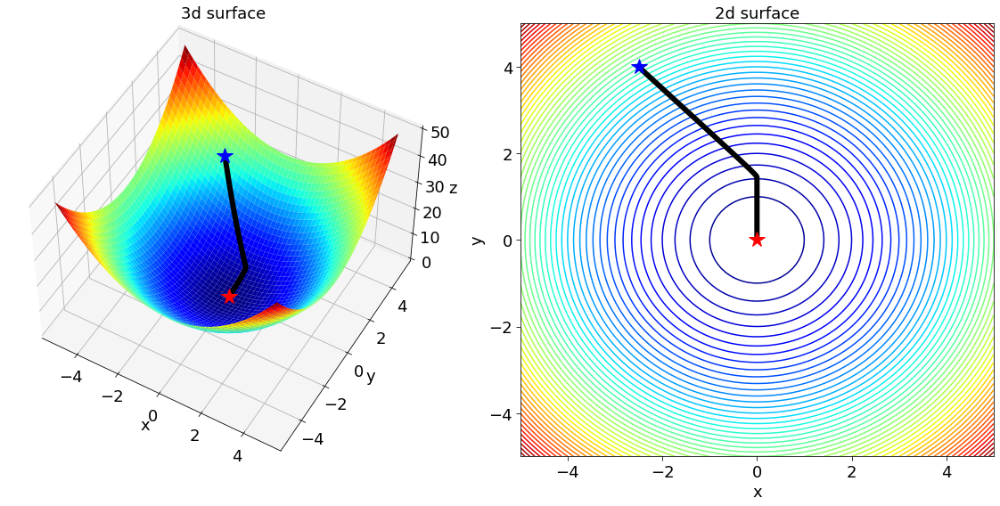

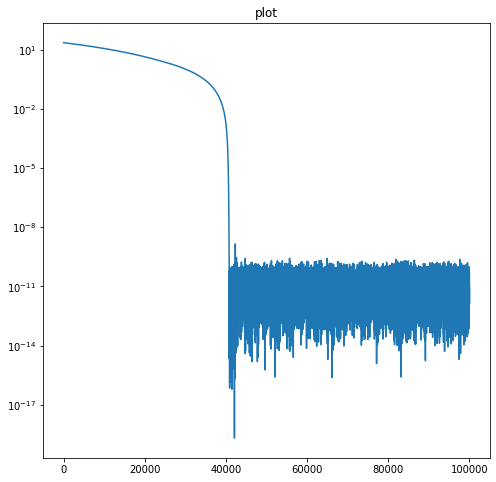

In [ ]:
## PLOT SURFACE AND TRAJECTORY

fig = plt.figure(figsize=(16,8))

ax1 = plot_utils.plot_surf_3d(X, Y, Z, fig, subplot_id=121, elev=50, cmap="jet", title="3d surface")
plot_utils.overlay_trajectory_3d(ax=ax1, surface=surfaces.paraboloid, trajectory=traj, color="k-", lw=6, label="adam")

ax2 = plot_utils.plot_surf_2d(X, Y, Z, fig, subplot_id=122, cmap="jet", title="2d surface")
plot_utils.overlay_trajectory_2d(ax=ax2, trajectory=traj, color="k-", lw=6, label="adam")

# ax3 = plot_surf_2d_fill(X, Y, Z, fig, subplot_id=133, cmap="jet", title="2d surface (filled)")
# overlay_trajectory_2d(ax=ax3, trajectory=traj, color="k-", lw=6, label="adam")

fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(8,8))
ax  = plot_utils.plot_loss(loss=loss, n_epochs=n_epochs, fig=fig)
plt.show()

### Test with a weird paraboloid surface

Everything seems to work fine, let's try now changing the surface, from a paraboloid to a more complex one, with non trivial minima distribution:
$$
f = 1+\frac{1}{2}q(x^2+y^2)-\cos[2\pi(xy-y^2)]
$$

In [ ]:
## GRID
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)

# SURFACE
q = 10
Z = surfaces.weird_paraboloid(X, Y, q)

# ADAM ALGORITHM
init     = [-2, 2]
n_epochs = 3*10**3
eta      = 10**-1
beta1    = 0.99 # default 0.90
beta2    = 0.99 # default 0.99

traj = algorithms.adam(
    grad     = surfaces.weird_paraboloid_grad, 
    init     = init, 
    n_epochs = n_epochs,
    eta      = eta,
    gamma    = beta1,
    beta     = beta2
)

loss = surfaces.weird_paraboloid(traj[:,0],traj[:,1])

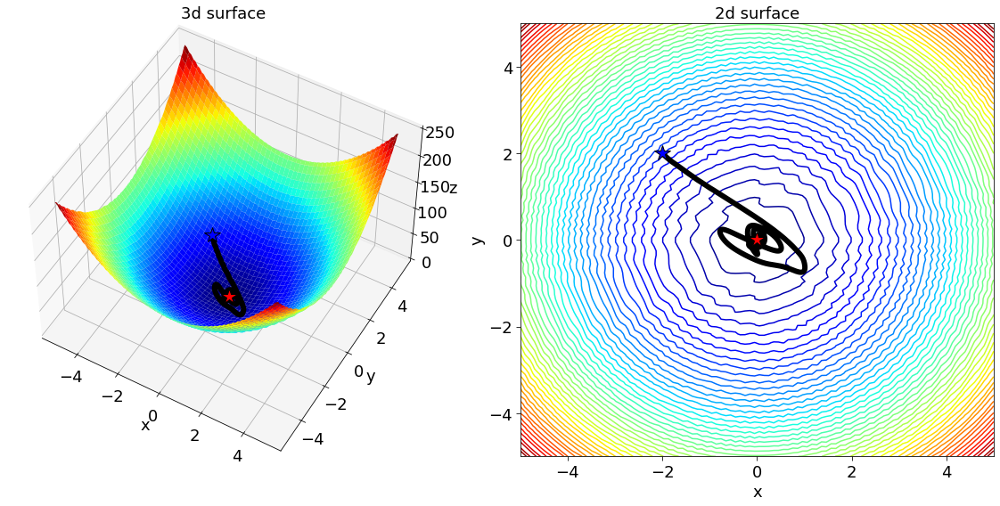

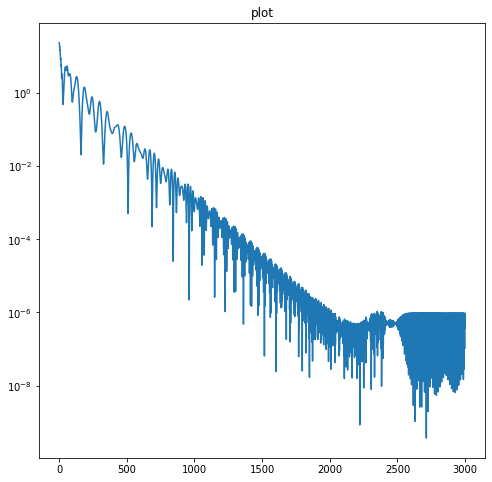

In [ ]:
## PLOT SURFACE AND TRAJECTORY

fig = plt.figure(figsize=(16,8))

ax1 = plot_utils.plot_surf_3d(X, Y, Z, fig, subplot_id=121, elev=50, cmap="jet", title="3d surface")
plot_utils.overlay_trajectory_3d(ax=ax1, surface=surfaces.weird_paraboloid, trajectory=traj, color="k-", lw=6, label="adam")

ax2 = plot_utils.plot_surf_2d(X, Y, Z, fig, subplot_id=122, cmap="jet", title="2d surface")
plot_utils.overlay_trajectory_2d(ax=ax2, trajectory=traj, color="k-", lw=6, label="adam")

# ax3 = plot_surf_2d_fill(X, Y, Z, fig, subplot_id=133, cmap="jet", title="2d surface (filled)")
# overlay_trajectory_2d(ax=ax3, trajectory=traj, color="k-", lw=6, label="adam")

fig.tight_layout()
plt.show()


fig = plt.figure(figsize=(8,8))
ax  = plot_utils.plot_loss(loss=loss, n_epochs=n_epochs, fig=fig)
plt.show()

With this non-trivial surface it can be observed that ADAM algorithm starts to become unstable with respect to a minimum that was reached at some earlier iteration t. This  is solved with the ADAMAX algorithm.

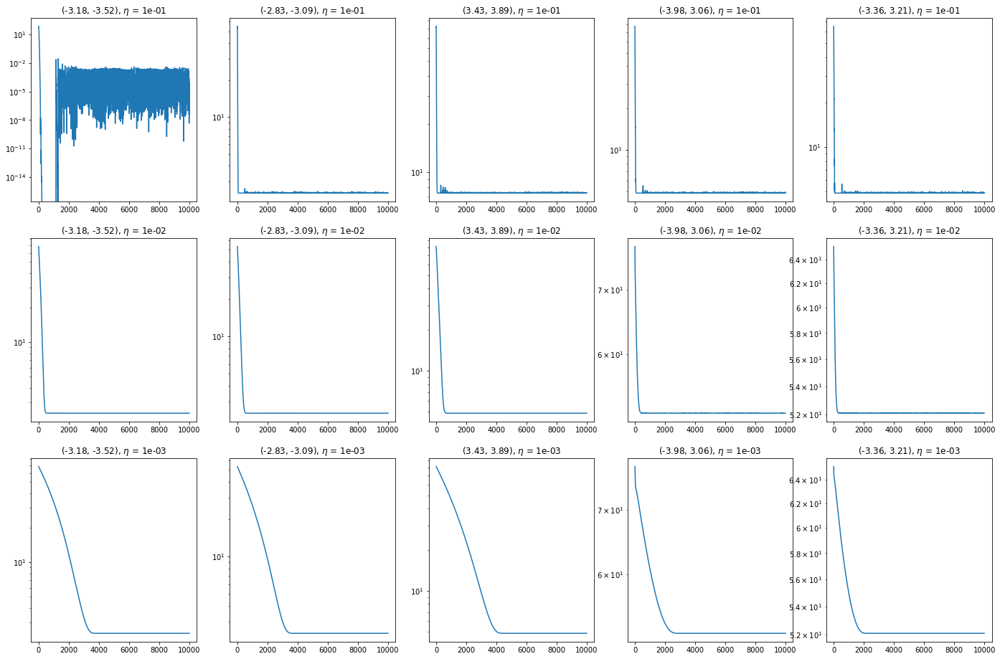

In [ ]:
# N sup-iterations of ADAM with different initial points, for each sup-iteration M sub.iteration with different etas
N = 5
M = 3

min_init_grid = -4
max_init_grid = 4

np.random.seed(666)
init_points = np.random.randn(N, 2)%(max_init_grid-min_init_grid)+min_init_grid
etas = [10**-1, 10**-2, 10**-3]
n_epochs = 10**4
beta1    = 0.8 # default 0.90
beta2    = 0.99 # default 0.99

trajectories = []
fig = plt.figure(figsize=(24,16))

for i in range(N):
    for j in range(M):
        traj_ = algorithms.adam(
            grad     = surfaces.weird_paraboloid_grad, 
            init     = init_points[i], 
            n_epochs = n_epochs,
            eta      = etas[j],
            gamma    = beta1,
            beta     = beta2
        )
        trajectories.append(traj_)
        loss_ = surfaces.weird_paraboloid(traj_[:,0],traj_[:,1])
        ax  = plot_utils.plot_loss(
            loss=loss_, 
            n_epochs=n_epochs, 
            fig=fig, 
            subplot_id=None, 
            n_rows=M, 
            n_cols=N, 
            sub_id=i+N*j+1, 
            title=r"(%.2f, %.2f), $\eta$ = %.0e" % (init_points[i][0], init_points[i][1], etas[j])
        )

#fig.tight_layout()
plt.show()   

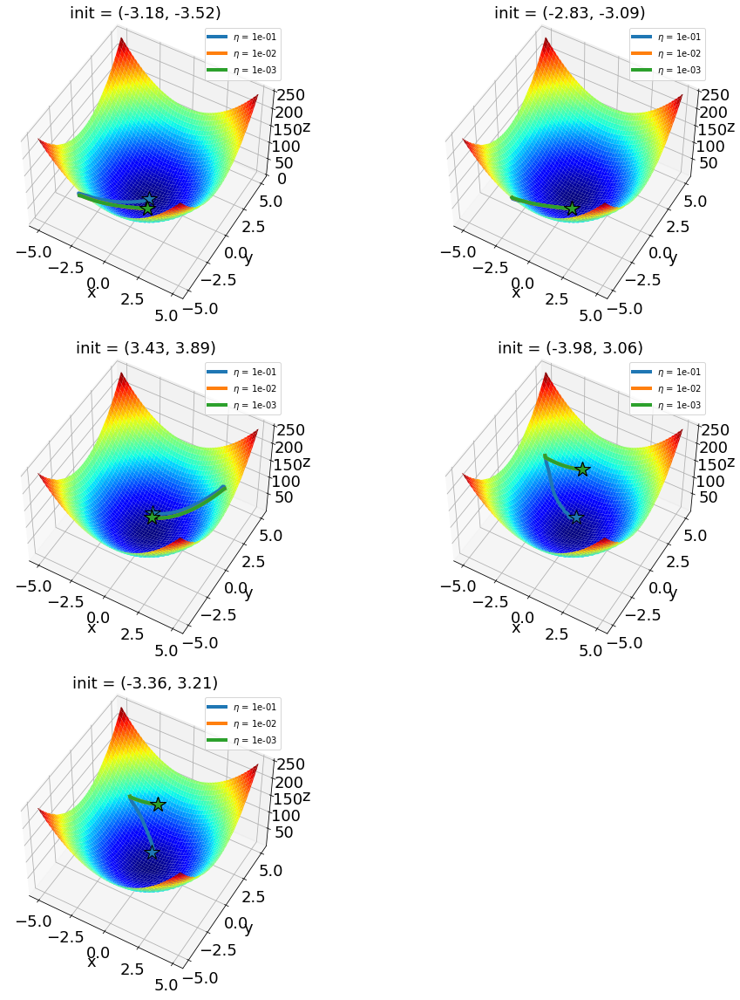

In [ ]:
fig = plt.figure(figsize=(16,20))

colors = ["tab:blue", "tab:orange", "tab:green"]

for i in range(N):
    ax = plot_utils.plot_surf_3d(
      X, Y, Z, 
      fig, 
      elev=50, 
      cmap="jet", 
      subplot_id=int(f"32{i+1}"), 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )
    for j in range(M):
      plot_utils.overlay_trajectory_3d(
        ax=ax, 
        surface=surfaces.weird_paraboloid, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4,
        show_i = False,
        color_f = colors[j],
        label=r"$\eta$ = %.0e" % (etas[j])
      )
    ax.legend()


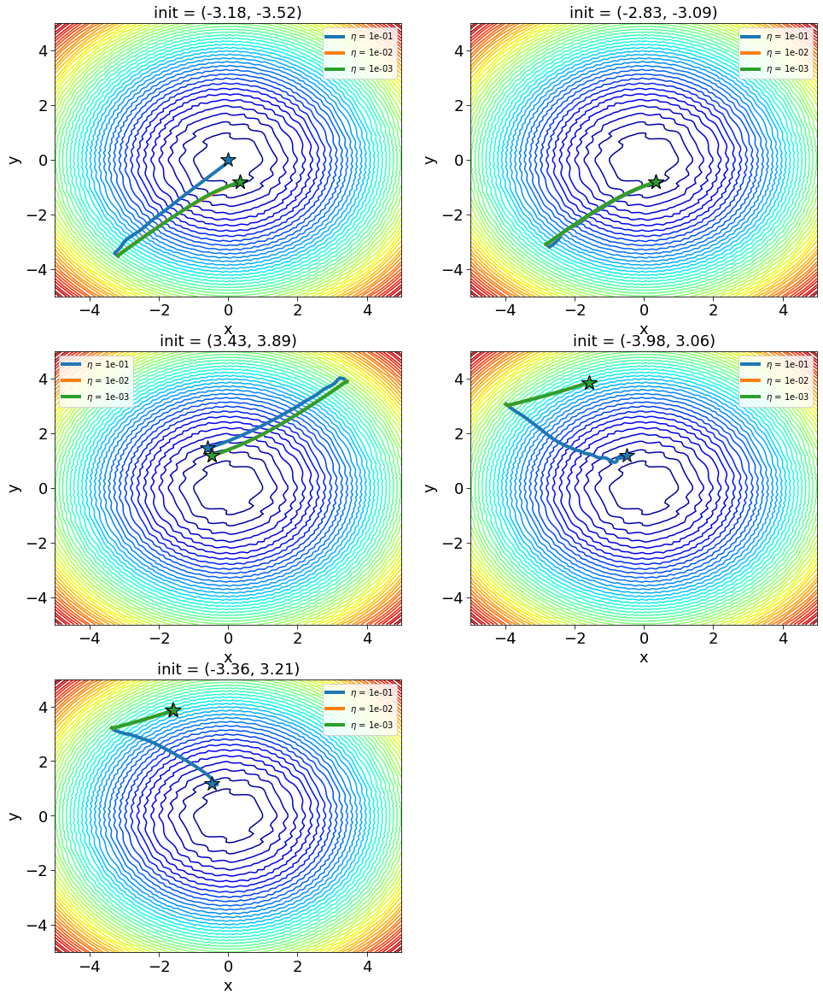

In [ ]:
fig = plt.figure(figsize=(16,20))
for i in range(N):
    ax = plot_utils.plot_surf_2d(
      X, Y, Z, 
      fig, 
      cmap="jet", 
      subplot_id=int(f"32{i+1}"), 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )
    for j in range(M):
      plot_utils.overlay_trajectory_2d(
        ax=ax, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4, 
        label=r"$\eta$ = %.0e" % (etas[j]),
        show_i=False,
        color_f = colors[j]
      )
    ax.legend() 

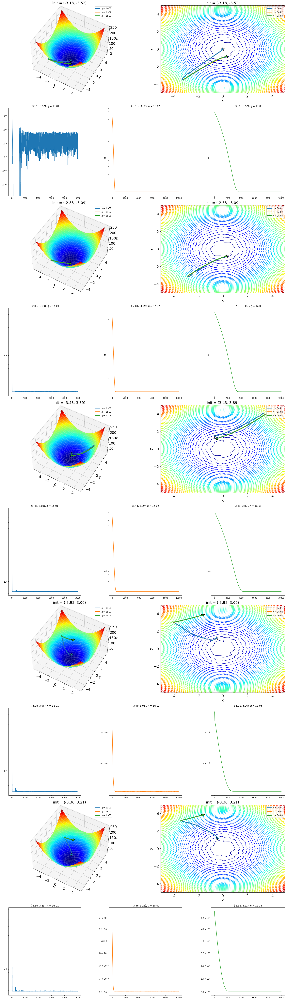

In [ ]:
# better visualization case by case 
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(20,70), constrained_layout=True)
gs = GridSpec(10, 6, figure=fig)

colors = ["tab:blue", "tab:orange", "tab:green"]

for i in range(N):
    ax_3d = plot_utils.plot_surf_3d(
      X, Y, Z, 
      fig, 
      elev=50, 
      cmap="jet", 
      subplot_id=gs[2*i, :3], 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )
    ax_2d = plot_utils.plot_surf_2d(
      X, Y, Z, 
      fig, 
      cmap="jet", 
      subplot_id=gs[2*i, 3:], 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )
    for j in range(M):
      plot_utils.overlay_trajectory_3d(
        ax=ax_3d, 
        surface=surfaces.weird_paraboloid, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4,
        show_i = False,
        color_f = colors[j],
        label=r"$\eta$ = %.0e" % (etas[j])
      )
      plot_utils.overlay_trajectory_2d(
        ax=ax_2d, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4, 
        label=r"$\eta$ = %.0e" % (etas[j]),
        show_i=False,
        color_f = colors[j]
      )
  
      loss_ = surfaces.weird_paraboloid(trajectories[i*M+j][:,0],trajectories[i*M+j][:,1])
      ax_loss  = plot_utils.plot_loss(
            loss=loss_, 
            n_epochs=n_epochs, 
            fig=fig, 
            subplot_id=gs[2*i+1, 2*j:2*j+2], 
            title=r"(%.2f, %.2f), $\eta$ = %.0e" % (init_points[i][0], init_points[i][1], etas[j]),
            color = colors[j]
        )
    ax_3d.legend()
    ax_2d.legend()

### ADAM vs ADAMAX comparison

In [ ]:
## ADAMAX on previous points
alpha = 0.4
trajectories_adamax = []

for i in range(N):
    traj_ = algorithms.adamax(
        grad     = surfaces.weird_paraboloid_grad, 
        init     = init_points[i], 
        n_epochs = n_epochs,
        #eta      = etas[j],
        beta1    = beta1,
        beta2     = beta2,
        alpha    = alpha
    )
    trajectories_adamax.append(traj_)

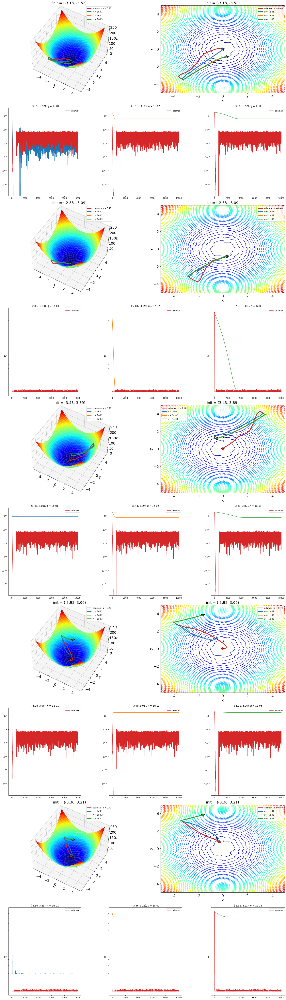

In [ ]:
# plot comparison with ADAM
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(20,70), constrained_layout=True)
gs = GridSpec(10, 6, figure=fig)

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

for i in range(N):
    ax_3d = plot_utils.plot_surf_3d(
      X, Y, Z, 
      fig, 
      elev=50, 
      cmap="jet", 
      subplot_id=gs[2*i, :3], 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )
    ax_2d = plot_utils.plot_surf_2d(
      X, Y, Z, 
      fig, 
      cmap="jet", 
      subplot_id=gs[2*i, 3:], 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )
    loss_adamax = surfaces.weird_paraboloid(trajectories_adamax[i][:,0],trajectories_adamax[i][:,1])
    plot_utils.overlay_trajectory_3d(
        ax=ax_3d, 
        surface=surfaces.weird_paraboloid, 
        trajectory=trajectories_adamax[i],
        color=colors[3], 
        lw=4,
        show_i = False,
        color_f = colors[3],
        label=r"adamax - $\alpha$ = %.2f" % (alpha)
      )
    plot_utils.overlay_trajectory_2d(
        ax=ax_2d, 
        trajectory=trajectories_adamax[i],
        color=colors[3], 
        lw=4, 
        label=r"adamax - $\alpha$ = %.2f" % (alpha),
        show_i=False,
        color_f = colors[3]
      )
    
    for j in range(M):
      plot_utils.overlay_trajectory_3d(
        ax=ax_3d, 
        surface=surfaces.weird_paraboloid, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4,
        show_i = False,
        color_f = colors[j],
        label=r"$\eta$ = %.0e" % (etas[j])
      )
      plot_utils.overlay_trajectory_2d(
        ax=ax_2d, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4, 
        label=r"$\eta$ = %.0e" % (etas[j]),
        show_i=False,
        color_f = colors[j]
      )
  
      loss_ = surfaces.weird_paraboloid(trajectories[i*M+j][:,0],trajectories[i*M+j][:,1])
      ax_loss  = plot_utils.plot_loss(
            loss=loss_, 
            n_epochs=n_epochs, 
            fig=fig, 
            subplot_id=gs[2*i+1, 2*j:2*j+2], 
            title=r"(%.2f, %.2f), $\eta$ = %.0e" % (init_points[i][0], init_points[i][1], etas[j]),
            color = colors[j]
        )
      ax_loss.plot(np.arange(0, n_epochs+1, 1), loss_adamax, color=colors[3], label="adamax")
      ax_loss.legend()

    ax_3d.legend()
    ax_2d.legend()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=452e6836-b7b8-455e-80d9-d4109b6baddf' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>